# ----------------------- Klasifikasi & Prediksi Gempa di Indonesia -----------------------

Kelompok 2 Data Science:
1. Nayeng Githa Aiyodya Ayunda
2. Nabila Rizka Syafitri
3. Tri Sultan Bulqiah
4. Ghea Safaryna Ryamizard

# Import Packages

In [1]:
#Library yang umum digunakan
import pandas as pd
import numpy as np

#Library untuk visualisasi data
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import pyplot

#Library untuk permodelan
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

#Library tambahan
import datetime as dt
import time

# Read Dataset

In [2]:
data = pd.read_table('dataset_earthquakes.tsv')
data.head()

,Unnamed: 0,eventID,datetime,latitude,longitude,magnitude,mag_type,depth,phasecount,azimuth_gap,...,doubleCouple,clvd,strikeNP1,dipNP1,rakeNP1,strikeNP2,dipNP2,rakeNP2,azgapFM,misfit
0,56577,bmg2019ahic,2019-01-05 00:02:19.243788+00:00,-8.855476,116.786026,2.084646,MLv,35,8.0,204.235542,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,56578,bmg2019ahij,2019-01-05 00:10:46.341458+00:00,1.779001,126.480248,4.361245,MLv,97,34.0,72.024076,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,56579,bmg2019ahjz,2019-01-05 00:59:05.203033+00:00,0.435449,100.684746,4.332770,MLv,240,26.0,147.728729,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,56580,bmg2019ahkd,2019-01-05 01:04:20.106873+00:00,4.329032,126.179474,5.091639,Mw,107,75.0,226.443036,...,0.956131,0.043869,168.219918,86.845533,-24.532362,259.658614,65.507254,-176.533241,226.443036,0.199065
4,56581,bmg2019ahlv,2019-01-05 01:55:38.881195+00:00,-0.840817,127.626923,5.108770,Mw,10,125.0,70.261945,...,0.735399,0.264601,329.476841,86.714016,171.935077,59.942188,81.948425,3.318735,70.261945,0.159476


In [3]:
data.isna().sum()

Unnamed: 0               0
eventID                  0
datetime                 0
latitude                 0
longitude                0
magnitude               59
mag_type                59
depth                    0
phasecount               2
azimuth_gap              0
location                 0
agency                   0
datetimeFM           44043
latFM                44043
lonFM                44043
magFM                44102
magTypeFM            44102
depthFM              44043
phasecountFM         44043
AzGapFM              44075
scalarMoment         44075
Mrr                  44075
Mtt                  44075
Mpp                  44075
Mrt                  44075
Mrp                  44075
Mtp                  44075
varianceReduction    44076
doubleCouple         44075
clvd                 44075
strikeNP1            44043
dipNP1               44043
rakeNP1              44043
strikeNP2            44043
dipNP2               44043
rakeNP2              44043
azgapFM              44075
m

# Preprocessing Data

## > Analisis Dataset

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45938 entries, 0 to 45937
Data columns (total 38 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         45938 non-null  int64  
 1   eventID            45938 non-null  object 
 2   datetime           45938 non-null  object 
 3   latitude           45938 non-null  float64
 4   longitude          45938 non-null  float64
 5   magnitude          45879 non-null  float64
 6   mag_type           45879 non-null  object 
 7   depth              45938 non-null  int64  
 8   phasecount         45936 non-null  float64
 9   azimuth_gap        45938 non-null  float64
 10  location           45938 non-null  object 
 11  agency             45938 non-null  object 
 12  datetimeFM         1895 non-null   object 
 13  latFM              1895 non-null   float64
 14  lonFM              1895 non-null   float64
 15  magFM              1836 non-null   float64
 16  magTypeFM          183

## > Mengambil Kolom yang Diperlukan

In [5]:
data.columns

Index(['Unnamed: 0', 'eventID', 'datetime', 'latitude', 'longitude',
       'magnitude', 'mag_type', 'depth', 'phasecount', 'azimuth_gap',
       'location', 'agency', 'datetimeFM', 'latFM', 'lonFM', 'magFM',
       'magTypeFM', 'depthFM', 'phasecountFM', 'AzGapFM', 'scalarMoment',
       'Mrr', 'Mtt', 'Mpp', 'Mrt', 'Mrp', 'Mtp', 'varianceReduction',
       'doubleCouple', 'clvd', 'strikeNP1', 'dipNP1', 'rakeNP1', 'strikeNP2',
       'dipNP2', 'rakeNP2', 'azgapFM', 'misfit'],
      dtype='object')

In [6]:
data_fixed = data.loc[:, ['datetime', 'latitude', 'longitude', 'magnitude', 'depth', 'location']]
data_fixed.head(10)

,datetime,latitude,longitude,magnitude,depth,location
0,2019-01-05 00:02:19.243788+00:00,-8.855476,116.786026,2.084646,35,"Sumbawa Region, Indonesia"
1,2019-01-05 00:10:46.341458+00:00,1.779001,126.480248,4.361245,97,Northern Molucca Sea
2,2019-01-05 00:59:05.203033+00:00,0.435449,100.684746,4.332770,240,"Northern Sumatra, Indonesia"
3,2019-01-05 01:04:20.106873+00:00,4.329032,126.179474,5.091639,107,"Talaud Islands, Indonesia"
4,2019-01-05 01:55:38.881195+00:00,-0.840817,127.626923,5.108770,10,"Halmahera, Indonesia"
5,2019-01-05 01:59:23.229433+00:00,-0.899501,127.509125,4.725267,10,"Halmahera, Indonesia"
6,2019-01-05 02:10:17.091923+00:00,-1.074624,127.060150,3.385472,10,"Halmahera, Indonesia"
7,2019-01-05 02:15:32.771319+00:00,-0.917148,127.643356,2.685277,10,"Halmahera, Indonesia"
8,2019-01-05 02:18:56.235258+00:00,-0.876158,127.580383,2.583779,10,"Halmahera, Indonesia"
9,2019-01-05 02:21:10.779446+00:00,-0.932854,127.469032,3.627732,10,"Halmahera, Indonesia"


In [7]:
data_fixed.describe()

,latitude,longitude,magnitude,depth
count,45938.000000,45938.000000,45879.000000,45938.000000
mean,-3.299177,119.402675,3.516593,48.101985
std,4.325509,10.965226,0.847352,84.486156
min,-10.998043,95.006195,0.638354,1.000000
25%,-7.699983,113.615026,2.910043,10.000000
50%,-2.867882,121.355045,3.434301,13.000000
75%,0.191312,127.048719,4.060254,43.000000
max,5.998381,140.998291,7.894698,750.000000


In [8]:
data_fixed.describe(exclude=np.number)

,datetime,location
count,45938,45938
unique,45938,51
top,2019-01-05 00:02:19.243788+00:00,"Sulawesi, Indonesia"
freq,1,4401


## > Mengolah Data 'datetime'

In [9]:
data_fixed['datetime'] = pd.to_datetime(data_fixed['datetime'])
data_fixed['date'] = pd.to_datetime(data_fixed['datetime'].dt.date)
data_fixed['week'] = data_fixed['datetime'].dt.strftime('W%V')
data_fixed['month'] = data_fixed['datetime'].dt.strftime('%m')
data_fixed['year'] = data_fixed['datetime'].dt.strftime('%Y')

data_fixed.head()

,datetime,latitude,longitude,magnitude,depth,location,date,week,month,year
0,2019-01-05 00:02:19.243788+00:00,-8.855476,116.786026,2.084646,35,"Sumbawa Region, Indonesia",2019-01-05,W01,01,2019
1,2019-01-05 00:10:46.341458+00:00,1.779001,126.480248,4.361245,97,Northern Molucca Sea,2019-01-05,W01,01,2019
2,2019-01-05 00:59:05.203033+00:00,0.435449,100.684746,4.332770,240,"Northern Sumatra, Indonesia",2019-01-05,W01,01,2019
3,2019-01-05 01:04:20.106873+00:00,4.329032,126.179474,5.091639,107,"Talaud Islands, Indonesia",2019-01-05,W01,01,2019
4,2019-01-05 01:55:38.881195+00:00,-0.840817,127.626923,5.108770,10,"Halmahera, Indonesia",2019-01-05,W01,01,2019


## > Membuat Kategorisasi

In [10]:
#Kategorisasi tingkat kedalaman gempa
depth_bins = [-.01, 70, 300, 800]
depth_labels = ['Dangkal', 'Sedang', 'Dalam']
data_fixed['depth_cat'] = pd.cut(data_fixed['depth'], bins=depth_bins, labels=depth_labels).astype('category')

#Kategorisasi tingkat magnitudo gempa
mag_bins = [-.01, 2.5, 5.4, 6.0, 6.9, 7.9, 9.5]
data_fixed['mag_cat'] = pd.cut(data_fixed['magnitude'], bins=mag_bins).cat.codes

data_fixed.head()

,datetime,latitude,longitude,magnitude,depth,location,date,week,month,year,depth_cat,mag_cat
0,2019-01-05 00:02:19.243788+00:00,-8.855476,116.786026,2.084646,35,"Sumbawa Region, Indonesia",2019-01-05,W01,01,2019,Dangkal,0
1,2019-01-05 00:10:46.341458+00:00,1.779001,126.480248,4.361245,97,Northern Molucca Sea,2019-01-05,W01,01,2019,Sedang,1
2,2019-01-05 00:59:05.203033+00:00,0.435449,100.684746,4.332770,240,"Northern Sumatra, Indonesia",2019-01-05,W01,01,2019,Sedang,1
3,2019-01-05 01:04:20.106873+00:00,4.329032,126.179474,5.091639,107,"Talaud Islands, Indonesia",2019-01-05,W01,01,2019,Sedang,1
4,2019-01-05 01:55:38.881195+00:00,-0.840817,127.626923,5.108770,10,"Halmahera, Indonesia",2019-01-05,W01,01,2019,Dangkal,1


## > Rearrange Columns

In [11]:
data_fixed = data_fixed.reindex(columns=['datetime', 'date', 'week', 'month', 'year', 'latitude', 'longitude', 'magnitude', 'mag_cat', 'depth', 'depth_cat', 'location'])
data_fixed.head()

,datetime,date,week,month,year,latitude,longitude,magnitude,mag_cat,depth,depth_cat,location
0,2019-01-05 00:02:19.243788+00:00,2019-01-05,W01,01,2019,-8.855476,116.786026,2.084646,0,35,Dangkal,"Sumbawa Region, Indonesia"
1,2019-01-05 00:10:46.341458+00:00,2019-01-05,W01,01,2019,1.779001,126.480248,4.361245,1,97,Sedang,Northern Molucca Sea
2,2019-01-05 00:59:05.203033+00:00,2019-01-05,W01,01,2019,0.435449,100.684746,4.332770,1,240,Sedang,"Northern Sumatra, Indonesia"
3,2019-01-05 01:04:20.106873+00:00,2019-01-05,W01,01,2019,4.329032,126.179474,5.091639,1,107,Sedang,"Talaud Islands, Indonesia"
4,2019-01-05 01:55:38.881195+00:00,2019-01-05,W01,01,2019,-0.840817,127.626923,5.108770,1,10,Dangkal,"Halmahera, Indonesia"


## > Check For Missing Value

In [12]:
data_fixed.isna().sum()

datetime      0
date          0
week          0
month         0
year          0
latitude      0
longitude     0
magnitude    59
mag_cat       0
depth         0
depth_cat     0
location      0
dtype: int64

## > Menghapus Baris Data yang Kosong

In [13]:
data_fixed = data_fixed.dropna(subset='magnitude').reset_index(drop=True)
data_fixed.isna().sum()

datetime     0
date         0
week         0
month        0
year         0
latitude     0
longitude    0
magnitude    0
mag_cat      0
depth        0
depth_cat    0
location     0
dtype: int64

## > Cek Data yang Duplikat

In [14]:
n_dup = data_fixed.shape[0] - data_fixed.drop_duplicates().shape[0]
if n_dup == 0:
    print("Congratulations! Tidak ada data yang duplikat.")
else:
    print(f"Sorry... Ada data yang duplikat sebanyak {n_dup} ")

Congratulations! Tidak ada data yang duplikat.


## > Cek Kategorisasi

In [15]:
data_fixed['depth_cat'].value_counts()

Dangkal    36977
Sedang      7977
Dalam        925
Name: depth_cat, dtype: int64

In [16]:
data_fixed['mag_cat'].value_counts()

1    40110
0     4536
2      951
3      260
4       22
Name: mag_cat, dtype: int64

In [17]:
data_fixed.head()

,datetime,date,week,month,year,latitude,longitude,magnitude,mag_cat,depth,depth_cat,location
0,2019-01-05 00:02:19.243788+00:00,2019-01-05,W01,01,2019,-8.855476,116.786026,2.084646,0,35,Dangkal,"Sumbawa Region, Indonesia"
1,2019-01-05 00:10:46.341458+00:00,2019-01-05,W01,01,2019,1.779001,126.480248,4.361245,1,97,Sedang,Northern Molucca Sea
2,2019-01-05 00:59:05.203033+00:00,2019-01-05,W01,01,2019,0.435449,100.684746,4.332770,1,240,Sedang,"Northern Sumatra, Indonesia"
3,2019-01-05 01:04:20.106873+00:00,2019-01-05,W01,01,2019,4.329032,126.179474,5.091639,1,107,Sedang,"Talaud Islands, Indonesia"
4,2019-01-05 01:55:38.881195+00:00,2019-01-05,W01,01,2019,-0.840817,127.626923,5.108770,1,10,Dangkal,"Halmahera, Indonesia"


# Visualisasi Data

## > Frekuensi Gempa di Indonesia dalam Kurun Waktu Tertentu

In [18]:
data_year = data_fixed.groupby(['year',])['date'].count().reset_index().rename(columns={'date':'count'})
data_year.sort_values(['year'])

,year,count
0,2019,11445
1,2020,9142
2,2021,11199
3,2022,10353
4,2023,3740


In [19]:
fig = px.bar(
    data_year, y='year', x='count',
    text_auto='.2s',
    category_orders={'Tahun': ['2019', '2020', '2021', '2022', '2023']},
    color=['#437dce', '#437dce', '#437dce', '#437dce', '#437dce'],
    color_discrete_map="identity",
    width=780
)

fig.update_layout(
    title="<b>Frekuensi Gempa di Indonesia 5 Tahun Terakhir</b><br><sub>Year</sub>",
    xaxis_title="Frekuensi",
    yaxis_title="",
    plot_bgcolor='#fbfbfa'
)

fig.show()

## > Jenis Kedalaman Gempa di Indonesia 5 Tahun Terakhir

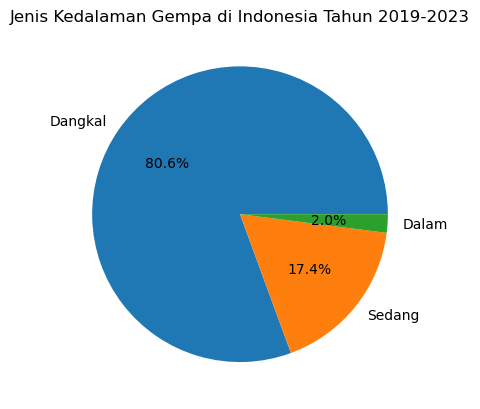

In [20]:
labels = ['Dangkal', 'Sedang', 'Dalam']
values = data_fixed['depth_cat'].value_counts().values
plt.pie(values, labels = labels, autopct='%1.1f%%')
plt.title('Jenis Kedalaman Gempa di Indonesia Tahun 2019-2023')
plt.show()

## > Hubungan Magnitudo Terhadap Tingkat Kedalaman Gempa di Indonesia

In [21]:
fig = px.histogram(data_fixed, x='magnitude', facet_row='depth_cat')

for i in range(3):
    fig['data'][i]['marker']['color'] = '#437dce'

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))

fig.update_layout(
    title="<b>Korelasi Magnitudo Terhadap Tingkat Kedalaman Gempa di Indonesia Tahun 2019-2023</b>",
    xaxis_title="Magnitudo</br><sub>",
    showlegend=False,
    plot_bgcolor='#fbfbfa'
)

fig.update_yaxes(visible=False, fixedrange=True)

fig.show()

## > Gempa Terbesar di Indonesia 5 Tahun Terakhir

In [22]:
data_year_week = data_fixed.groupby(['year', 'week'])['date'].count().reset_index().rename(columns={'date':'count'})
data_year_week.sort_values(['year', 'week'])

fig = px.line(
    data_year_week, x='week', y='count', 
    facet_row='year',
    width=780
)

for i in range(5):
    fig['data'][i]['line']['color'] = '#437dce'

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))

fig.update_traces(
    hovertemplate=("<b>%{x}</b><br>Frequency: %{y:.0f} ")
)

fig.update_layout(
    margin=dict(l=42, r=120),
    title="<b>Frekuensi Terjadi Gempa di Setiap Minggu Tahun 2019-2023</b>",
    xaxis_title=" ", 
    plot_bgcolor='#fbfbfa'
)

# hide and lock down yaxes
fig.update_yaxes(visible=False, fixedrange=True)

fig.show()

## > Data Sebaran Gempa di Indonesia

In [23]:
data_location = data_fixed.groupby(['location'])[['latitude', 'longitude']].median().reset_index().rename(columns={'latitude':'median_latitude', 'longitude':'median_longitude'})
data_location_count = data_fixed.groupby(['location'])['date'].count().reset_index().rename(columns={'date':'count'})
data_location_count = pd.merge(
    data_location, data_location_count,
    how='inner', on=['location']
)

data_location_count['location_short'] = data_location_count['location'].str.split(",", expand = True)[0] 
data_location_count.loc[data_location_count['count']<data_location_count['count'].quantile(0.8), 'location_short']='' 
data_location_count.head()

,location,median_latitude,median_longitude,count,location_short
0,Arafura Sea,-9.625705,134.877449,10,
1,"Aru Islands Region, Indonesia",-5.387751,133.738327,65,
2,"Bali Region, Indonesia",-8.254019,115.399776,516,
3,Bali Sea,-7.861933,117.344177,323,
4,Banda Sea,-6.564980,129.301483,2029,Banda Sea


In [24]:
location_count = data.groupby(pd.Grouper(key='location')).size().reset_index(name='count')
location_count_top = location_count.nlargest(10, 'count')[['location', 'count']]
fig = px.bar(location_count_top, x='location', y='count', color='location', text='count')
fig.update_layout(title_text='Top 10 Lokasi Gempa di Indonesia Tahun 2019-2023',
                  title_x=0.5, title_font=dict(size=30))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()

In [25]:
fig = px.scatter_geo(data_location_count, 
                    lat='median_latitude',
                    lon='median_longitude',
                    size='count',
                    text='location_short',
                    hover_name='location',
                    hover_data={'median_latitude':False,'median_longitude':False, 'location_short':False})

fig.update_geos(
    visible=True, resolution=110,
    showcountries=True, countrycolor="#000080" 
)

fig.update_traces(
    textfont_size=15,
    marker=dict(color='rgba(67, 125, 206, 0.85)')
)

fig.update_layout(
    title_text = "<b>Sebaran Gempa di Indonesia Tahun 2019-2023</b>",
    geo=dict(
        lonaxis = dict(
            range= [93, 144],
            dtick = 5
        ),
        lataxis = dict (
            range= [-13, 10],
            dtick = 5
        )
    )
)

fig.show()

In [26]:
fig = px.density_mapbox(data_fixed, lat=data_fixed['latitude'], lon=data_fixed['longitude'], z=data_fixed['magnitude'],
                        center=dict(lat=-0.789275, lon=113.921327), zoom=3.5,
                        mapbox_style="stamen-terrain",
                        radius=5,
                        opacity=0.5,
                        animation_frame=pd.DatetimeIndex(data_fixed['date']).year)
fig.update_layout(title_text='Sebaran Gempa di Indonesia Tahun 2019-2023',
                  title_x=0.5, title_font=dict(size=32))
fig.show()

## > Korelasi Data

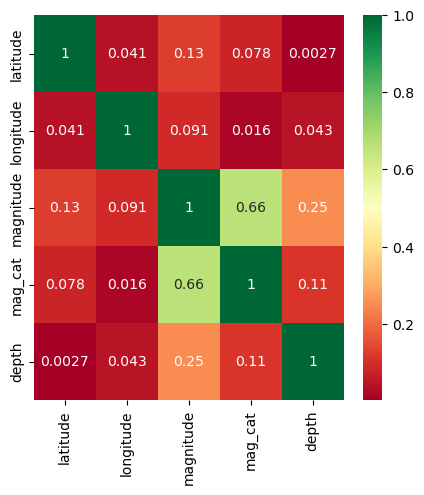

In [27]:
corrmat = data_fixed.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(5,5))

g=sns.heatmap(data_fixed[top_corr_features].corr(),annot=True,cmap='RdYlGn')

# Modelling

## > Data Preparation For Modelling

In [28]:
data_fixed.head()

,datetime,date,week,month,year,latitude,longitude,magnitude,mag_cat,depth,depth_cat,location
0,2019-01-05 00:02:19.243788+00:00,2019-01-05,W01,01,2019,-8.855476,116.786026,2.084646,0,35,Dangkal,"Sumbawa Region, Indonesia"
1,2019-01-05 00:10:46.341458+00:00,2019-01-05,W01,01,2019,1.779001,126.480248,4.361245,1,97,Sedang,Northern Molucca Sea
2,2019-01-05 00:59:05.203033+00:00,2019-01-05,W01,01,2019,0.435449,100.684746,4.332770,1,240,Sedang,"Northern Sumatra, Indonesia"
3,2019-01-05 01:04:20.106873+00:00,2019-01-05,W01,01,2019,4.329032,126.179474,5.091639,1,107,Sedang,"Talaud Islands, Indonesia"
4,2019-01-05 01:55:38.881195+00:00,2019-01-05,W01,01,2019,-0.840817,127.626923,5.108770,1,10,Dangkal,"Halmahera, Indonesia"


## > Menghapus Kolom yang Tidak Diperlukan

In [29]:
final_data = data_fixed.drop(['datetime', 'date', 'week', 'month', 'year', 'depth_cat', 'location'], axis=1)
final_data.head()

,latitude,longitude,magnitude,mag_cat,depth
0,-8.855476,116.786026,2.084646,0,35
1,1.779001,126.480248,4.361245,1,97
2,0.435449,100.684746,4.332770,1,240
3,4.329032,126.179474,5.091639,1,107
4,-0.840817,127.626923,5.108770,1,10


## > Splitting The Data

In [30]:
X = final_data[['latitude', 'longitude', 'magnitude', 'depth']]
y = final_data['mag_cat']

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
# for naive bayes
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred_gnb = gnb.predict(X_test)

## for knn
knn = KNeighborsClassifier(n_neighbors = 5)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)

## for Linear SVM
svm = SVC()
svm.fit(X_train, y_train)
y_pred_svm = svm.predict(X_test)

C:\Users\Asani\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



## > Visualisasi hasil

In [33]:
## Compare Accuracy
from sklearn.metrics import confusion_matrix, accuracy_score
df = pd.DataFrame({
    'Model Name': ['KNN', 'SVM', 'Naive Bayes'],
    'Accuracy Score': [accuracy_score(y_test, y_pred_knn), 
                       accuracy_score(y_test, y_pred_svm), 
                       accuracy_score(y_test, y_pred_gnb)],
})
df

,Model Name,Accuracy Score
0,KNN,0.940715
1,SVM,0.874237
2,Naive Bayes,0.971774


In [34]:
df = df.set_index('Model Name')
df

,Accuracy Score
Model Name,
KNN,0.940715
SVM,0.874237
Naive Bayes,0.971774


Text(0, 0.5, 'Accuracy Score')

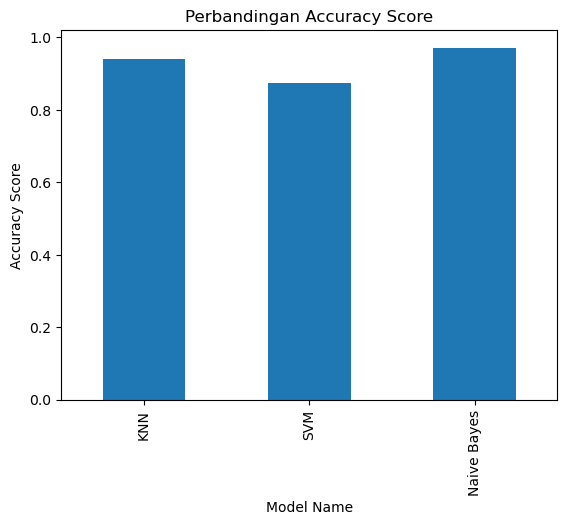

In [35]:
df['Accuracy Score'].plot(kind="bar", title="test")
plt.title("Perbandingan Accuracy Score")
plt.xlabel("Model Name")
plt.ylabel("Accuracy Score")